<img src="https://github.com/hernancontigiani/ceia_memorias_especializacion/raw/master/Figures/logoFIUBA.jpg" width="500" align="center">


# **Visión por Computadora II - TPI**
# **Modelo de Segmentación de Imágenes Satelitales**

> **Carrera de Especialización en Inteligencia Artificial, Facultad de Ingeniería**
>
> **Universidad de Buenos Aires, Agosto de 2024**
>
> Tatiana Arenas Suárez (particulastato@gmail.com)
>
> Edgar David Guarin Castro (davidg@marketpsychdata.com)

En el presente trabajo se usan las imágenes del dominio rural del dataset [LoveDA: Land-cOVEr Domain Adaptive Semantic Segmentation](https://datasetninja.com/remote-sensing-land-cover-dataset), con el fin de entrenar un modelo de segmentación que permita detectar diferentes tipos de regiones u objetos en imágenes de zonas rurales.

El LoveDA es un conjunto de datos para la segmentación semántica en teledetección de la cubierta terrestre. Contiene 5987 imágenes de alta resolución espacial (HSR) capturadas en tres ciudades chinas (Nanjing, Changzhou y Wuhan), cubriendo tanto áreas urbanas como rurales. Incluye 20658 objetos etiquetados en 7 clases diferentes: background, road, building, forest, water, agriculture, and barren.

El dataset puede ser dividido en 2 areas: rural (2358 imágenes) y urbana (1833 imágenes). También se encuentra dividido en un conjunto de entrenamiento (2522 imágenes), uno de test (1796 imágenes), y uno de validación (1669 imágenes).


## **0. Importando librerías**

In [ ]:
import cv2
import math
import matplotlib.pyplot as plt
import numpy as np
import os
import PIL
import random
import shutil
import sys
import torch
import torch.nn as nn
import torch.nn.functional as F
import torch.utils.data
import torchvision.transforms as transforms

from glob import glob
from google.colab import drive
from random import shuffle
from scipy import ndimage
from torch import nn
from torch.autograd import Variable
from tqdm.notebook import tqdm

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

%matplotlib inline

## **1. Descargando los datos**

Debido al gran tamaño del dataset LoveDA, se descargaron únicamente las imágenes de las áreas rurales y se guardaron el en archivo Train_4.zip

In [ ]:
#-----------------
# Conectando con Google Drive para guardar los datos
#-----------------
drive.mount('/content/drive')

Mounted at /content/drive


Las imágenes son extraídas y guardadas localmente:

In [ ]:
#-----------------
# Extrayendo los datos del archivo ZIP
#-----------------
filename = "/content/drive/MyDrive/Unet_vision2/Train_4.zip"
extract_dir = "./"
archive_format = "zip"

shutil.unpack_archive(filename, extract_dir, archive_format)

## **2. Preparando los datos**

Se define inicialmente la clase `segDataset` que es una extensión de torch.utils.data.Dataset de PyTorch, diseñada para cargar y preprocesar imágenes rurales del conjunto de datos LoveDA:

In [ ]:
class segDataset(torch.utils.data.Dataset):
    #-----------------
    # Constructor para obtener los datos y definir transformaciones y clases
    #-----------------
    def __init__(self, root, training, transform=None):
        super(segDataset, self).__init__()
        self.root = root
        self.training = training
        self.transform = transform
        self.IMG_NAMES = sorted(glob(self.root + '/Rural/images_png/*.png'))
        self.BGR_classes = {'agriculture' : [7,0,0],
                            'forest'      : [6,0,0],
                            'barren'      : [5,0,0],
                            'water'       : [4,0,0],
                            'road'        : [3,0,0],
                            'building'    : [2,0,0],
                            'background'  : [1,0,0],
                            'unlabeled'   : [0,0,0]
                            } # Clases en formato BGR ordenadas de mayor a menor intensidad

        self.bin_classes = ['unlabeled', 'background', 'building', 'road', 'water', 'barren', 'forest', 'agriculture']


    #-----------------
    # Carga de imágenes y máscaras
    #-----------------
    def __getitem__(self, idx):
        img_path = self.IMG_NAMES[idx]
        mask_path = img_path.replace('images', 'masks')

        image = cv2.imread(img_path)
        mask = cv2.imread(mask_path)
        cls_mask = np.zeros(mask.shape)
        cls_mask[mask == self.BGR_classes['unlabeled']] = self.bin_classes.index('unlabeled')
        cls_mask[mask == self.BGR_classes['background']] = self.bin_classes.index('background')
        cls_mask[mask == self.BGR_classes['building']] = self.bin_classes.index('building')
        cls_mask[mask == self.BGR_classes['road']] = self.bin_classes.index('road')
        cls_mask[mask == self.BGR_classes['water']] = self.bin_classes.index('water')
        cls_mask[mask == self.BGR_classes['barren']] = self.bin_classes.index('barren')
        cls_mask[mask == self.BGR_classes['forest']] = self.bin_classes.index('forest')
        cls_mask[mask == self.BGR_classes['agriculture']] = self.bin_classes.index('agriculture')
        cls_mask = cls_mask[:,:,0]

        #-----------------
        # Aplicación de transformaciones durante el entrenamiento
        #-----------------
        if self.training==True:
            if self.transform:
              image = transforms.functional.to_pil_image(image)
              image = self.transform(image)
              image = np.array(image)

            # rotacion 90 grados
            if np.random.rand()<0.5:
              angle = np.random.randint(4) * 90
              image = ndimage.rotate(image,angle,reshape=True)
              cls_mask = ndimage.rotate(cls_mask,angle,reshape=True)

            # giro vertical
            if np.random.rand()<0.5:
              image = np.flip(image, 0)
              cls_mask = np.flip(cls_mask, 0)

            # giro horizonal
            if np.random.rand()<0.5:
              image = np.flip(image, 1)
              cls_mask = np.flip(cls_mask, 1)

        #-----------------
        # Redimensionando la imagen
        #-----------------
        image = cv2.resize(image, (512,512))/255.0
        cls_mask = cv2.resize(cls_mask, (512,512))
        image = np.moveaxis(image, -1, 0)

        #-----------------
        # Convirtiendo la imagen en un tensor
        #-----------------
        return torch.tensor(image).float(), torch.tensor(cls_mask, dtype=torch.int64)


    #-----------------
    # Numero total de imagenes en el dataset
    #-----------------
    def __len__(self):
        return len(self.IMG_NAMES)

Con el fin de aumentar la robustez del modelo frente a variaciones en las imágenes durante el entrenamiento, se definen las siguientes transformaciones (*Data augmentation*):

- Ajuste aleatorio del brillo, contraste, saturación y tono de las imágenes para simular variaciones de iluminación y color con `ColorJitter`.
- Desenfoque gaussiano con un radio de kernel de 3 y una sigma (intensidad del desenfoque) aleatoria entre 0.1 y 2.0 por medio de la función `GaussianBlur`.

In [ ]:
#-----------------
# Ajustando brillo, contraste, saturacion y tono
#-----------------
color_shift = transforms.ColorJitter(.1,.1,.1,.1)

#-----------------
# Desenfoque gaussiano
#-----------------
blurriness = transforms.GaussianBlur(3, sigma=(0.1, 2.0))

#-----------------
# Aplicando las transformaciones al dataset
#-----------------
t = transforms.Compose([color_shift, blurriness])
dataset = segDataset('./Train_4', training = True, transform= t)

#-----------------
# Tamaño del dataset
#-----------------
print(f"Número de imágenes en el dataset: {len(dataset)}")

Número de imágenes en el dataset: 201


El dataset tiene un tamaño de 201 imágenes para facilitar los tiempos de entrenamiento. No obstante, al usar más imágenes es posible incrementar la precisión del entrenamiento y disminuir las pérdidas, pero con un costo computacional mayor del que no se disponibilizaba.

Luego de transformar las imágenes, se visualiza una imagen y su correspondiente máscara de segmentación del dataset para ver cómo se alinean la imagen de entrada y su máscara de segmentación:

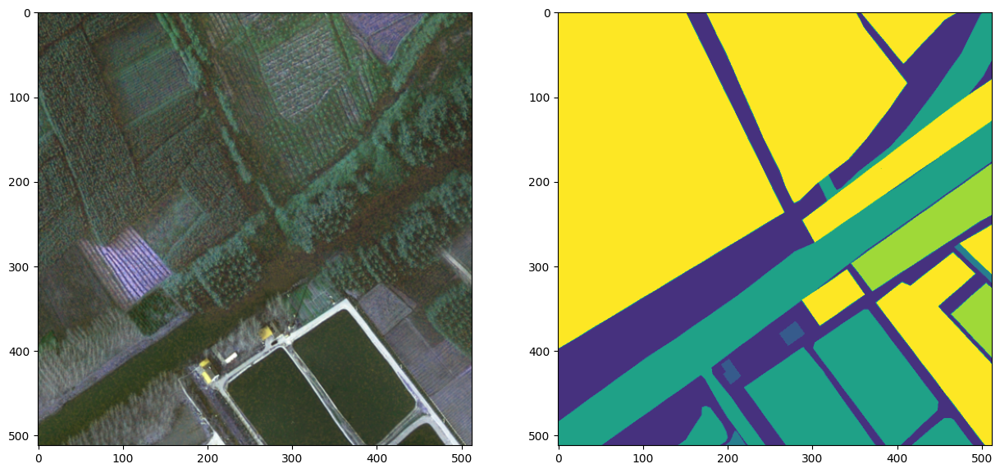

In [ ]:
#-----------------
# Cargando el primer par de datos
#-----------------
d = dataset[1]

#-----------------
# Visualizando la imagen y su mascara
#-----------------
plt.figure(figsize=(15,15))
plt.subplot(1,2,1)
plt.imshow(np.moveaxis(d[0].numpy(),0,-1))
plt.subplot(1,2,2)
plt.imshow(d[1].numpy())

En la imagen anterior se muestra:

- la imagen original (izquierda) donde se observan campos agrícolas, vegetación y posibles caminos.

- la máscara de segmentación (derecha) donde se aprecian diferentes colores representando las diferentes clases de terreno que han sido segmentadas. Por ejemplo, el color amarillo podría representar áreas agrícolas, el verde podría representar vegetación, y el azul o morado podrían representar cuerpos de agua o caminos.

## **3. Datos de entrenamiento y prueba**

El conjunto de imágenes es dividido en entrenamiento y prueba, de modo que el conjunto de entrenamiento contiene el 90% de las imágenes, y el conjunto de prueba contiene el 10%. Esto permite evaluar el modelo con un subconjunto específico de los datos, asegurando que las pruebas se realicen sobre datos no vistos durante el entrenamiento.

In [ ]:
#-----------------
# Calculando el tamaño del conjunto de prueba
#-----------------
test_num = int(0.1 * len(dataset))
print(f'Numero de imagenes de prueba: {test_num}')

#-----------------
# Dividiendo el dataset en entrenamiento y prueba
#-----------------
train_dataset, test_dataset = torch.utils.data.random_split(dataset, [len(dataset)-test_num, test_num], generator=torch.Generator().manual_seed(101))

Numero de imagenes de prueba: 20


Con los datos de entrenamiento y prueba definidos, se establece un tamaño de lote (BATCH_SIZE) de 4. Esto significa que cada lote en el entrenamiento y prueba tendrá 4 imágenes. Luego se crean los `DataLoader` para entrenamiento y prueba:

In [ ]:
BATCH_SIZE = 4

#-----------------
# Dataloader de entrenamiento con datos barajados (shuffle=True)
#-----------------
train_dataloader = torch.utils.data.DataLoader(
    train_dataset, batch_size=BATCH_SIZE, shuffle=True, num_workers=2)

#-----------------
# Dataloader de prueba con datos no barajados (shuffle=False)
#-----------------
test_dataloader = torch.utils.data.DataLoader(
    test_dataset, batch_size=BATCH_SIZE, shuffle=False, num_workers=1)

## **4. Modelo U-net**

La arquitectura escogida para realizar la segmentación semántica de las imágenes es la U-Net. Esta arquitectura de red neuronal convolucional posee la siguiente estructura:

- Contracción (Encoder): El primer camino reduce la resolución de la imagen a través de bloques de convolución y pooling, extrayendo características de alto nivel.

- Expansión (Decoder): El segundo camino incrementa la resolución, utilizando operaciones de upsampling y convoluciones para recuperar detalles y precisión espacial, combinando información con las características de la fase de contracción mediante concatenación (skip connections).

- Salida: La red termina con una capa de convolución que produce la segmentación final en la misma resolución que la imagen de entrada.

Para lograr esto, se definen inicialmente las siguientes clases:

- `DoubleConv`: Implementa dos convoluciones secuenciales con normalización por lotes y activación ReLU. Este es un bloque básico que se utiliza repetidamente en la red.

- `Down`: Realiza una reducción de escala usando un MaxPooling seguido por un DoubleConv. Es parte del camino de "contracción" en la U-Net.

- `Up`: Realiza un aumento de escala (upsampling) y luego aplica un DoubleConv. Se utiliza en el camino de "expansión" en la U-Net, combinando características de las capas anteriores mediante concatenación.

- `OutConv`: Realiza la convolución final que reduce el número de canales a la cantidad de clases en la salida.

In [ ]:
class DoubleConv(nn.Module):
    """(convolution => [BN] => ReLU) * 2"""

    def __init__(self, in_channels, out_channels, mid_channels=None):
        super().__init__()
        if not mid_channels:
            mid_channels = out_channels
        self.double_conv = nn.Sequential(
            nn.Conv2d(in_channels, mid_channels, kernel_size=3, padding=1),
            nn.BatchNorm2d(mid_channels),
            nn.ReLU(inplace=True),
            nn.Conv2d(mid_channels, out_channels, kernel_size=3, padding=1),
            nn.BatchNorm2d(out_channels),
            nn.ReLU(inplace=True)
        )

    def forward(self, x):
        return self.double_conv(x)


class Down(nn.Module):
    """Downscaling with maxpool then double conv"""

    def __init__(self, in_channels, out_channels):
        super().__init__()
        self.maxpool_conv = nn.Sequential(
            nn.MaxPool2d(2),
            DoubleConv(in_channels, out_channels)
        )

    def forward(self, x):
        return self.maxpool_conv(x)


class Up(nn.Module):
    """Upscaling then double conv"""

    def __init__(self, in_channels, out_channels, bilinear=True):
        super().__init__()

        #-----------------
        # si es bilinear, usa convoluciones normales para reducir el numero de canales
        #-----------------
        if bilinear:
            self.up = nn.Upsample(scale_factor=2, mode='bilinear', align_corners=True)
            self.conv = DoubleConv(in_channels, out_channels, in_channels // 2)
        else:
            self.up = nn.ConvTranspose2d(in_channels , in_channels // 2, kernel_size=2, stride=2)
            self.conv = DoubleConv(in_channels, out_channels)


    def forward(self, x1, x2):
        x1 = self.up(x1)
        # el input es CHW
        diffY = x2.size()[2] - x1.size()[2]
        diffX = x2.size()[3] - x1.size()[3]

        x1 = F.pad(x1, [diffX // 2, diffX - diffX // 2,
                        diffY // 2, diffY - diffY // 2])

        #-----------------
        # si hay problemas de padding, visitar:
        # https://github.com/HaiyongJiang/U-Net-Pytorch-Unstructured-Buggy/commit/0e854509c2cea854e247a9c615f175f76fbb2e3a
        # https://github.com/xiaopeng-liao/Pytorch-UNet/commit/8ebac70e633bac59fc22bb5195e513d5832fb3bd
        #-----------------

        x = torch.cat([x2, x1], dim=1)
        return self.conv(x)


class OutConv(nn.Module):
    def __init__(self, in_channels, out_channels):
        super(OutConv, self).__init__()
        self.conv = nn.Conv2d(in_channels, out_channels, kernel_size=1)

    def forward(self, x):
        return self.conv(x)

Con base en lo anterior, se define el modelo U-Net:

In [ ]:
class UNet(nn.Module):
    def __init__(self, n_channels, n_classes, bilinear=True):
        super(UNet, self).__init__()
        self.n_channels = n_channels
        self.n_classes = n_classes
        self.bilinear = bilinear

        self.inc = DoubleConv(n_channels, 64)
        self.down1 = Down(64, 128)
        self.down2 = Down(128, 256)
        self.down3 = Down(256, 512)
        factor = 2 if bilinear else 1
        self.down4 = Down(512, 1024 // factor)
        self.up1 = Up(1024, 512 // factor, bilinear)
        self.up2 = Up(512, 256 // factor, bilinear)
        self.up3 = Up(256, 128 // factor, bilinear)
        self.up4 = Up(128, 64, bilinear)
        self.outc = OutConv(64, n_classes)

    def forward(self, x):
        x1 = self.inc(x)
        x2 = self.down1(x1)
        x3 = self.down2(x2)
        x4 = self.down3(x3)
        x5 = self.down4(x4)
        x = self.up1(x5, x4)
        x = self.up2(x, x3)
        x = self.up3(x, x2)
        x = self.up4(x, x1)
        logits = self.outc(x)
        return logits

## **5. Modelo SegNet**

Este modelo se basa en una arquitectura de codificación-decodificación, similar a U-Net, pero en lugar de conexiones de salto, utiliza los indices de pooling max en el decoder para guiar la reconstrucción espacial de las imágenes, lo que ahorra memoria y mejora la eficiencia.

A continuación se define la estructura del modelo:

In [ ]:
class SegNet(nn.Module):
    def __init__(self, n_classes):
        super(SegNet, self).__init__()

        #-----------------
        # Encoder
        #-----------------
        self.enc1 = nn.Sequential(
            nn.Conv2d(3, 64, kernel_size=3, padding=1),
            nn.BatchNorm2d(64),
            nn.ReLU(),
            nn.Conv2d(64, 64, kernel_size=3, padding=1),
            nn.BatchNorm2d(64),
            nn.ReLU()
        )
        self.pool1 = nn.MaxPool2d(kernel_size=2, stride=2, return_indices=True)

        self.enc2 = nn.Sequential(
            nn.Conv2d(64, 128, kernel_size=3, padding=1),
            nn.BatchNorm2d(128),
            nn.ReLU(),
            nn.Conv2d(128, 128, kernel_size=3, padding=1),
            nn.BatchNorm2d(128),
            nn.ReLU()
        )
        self.pool2 = nn.MaxPool2d(kernel_size=2, stride=2, return_indices=True)

        self.enc3 = nn.Sequential(
            nn.Conv2d(128, 256, kernel_size=3, padding=1),
            nn.BatchNorm2d(256),
            nn.ReLU(),
            nn.Conv2d(256, 256, kernel_size=3, padding=1),
            nn.BatchNorm2d(256),
            nn.ReLU(),
            nn.Conv2d(256, 256, kernel_size=3, padding=1),
            nn.BatchNorm2d(256),
            nn.ReLU()
        )
        self.pool3 = nn.MaxPool2d(kernel_size=2, stride=2, return_indices=True)

        self.enc4 = nn.Sequential(
            nn.Conv2d(256, 512, kernel_size=3, padding=1),
            nn.BatchNorm2d(512),
            nn.ReLU(),
            nn.Conv2d(512, 512, kernel_size=3, padding=1),
            nn.BatchNorm2d(512),
            nn.ReLU(),
            nn.Conv2d(512, 512, kernel_size=3, padding=1),
            nn.BatchNorm2d(512),
            nn.ReLU()
        )
        self.pool4 = nn.MaxPool2d(kernel_size=2, stride=2, return_indices=True)

        self.enc5 = nn.Sequential(
            nn.Conv2d(512, 512, kernel_size=3, padding=1),
            nn.BatchNorm2d(512),
            nn.ReLU(),
            nn.Conv2d(512, 512, kernel_size=3, padding=1),
            nn.BatchNorm2d(512),
            nn.ReLU(),
            nn.Conv2d(512, 512, kernel_size=3, padding=1),
            nn.BatchNorm2d(512),
            nn.ReLU()
        )
        self.pool5 = nn.MaxPool2d(kernel_size=2, stride=2, return_indices=True)

        #-----------------
        # Decoder
        #-----------------
        self.unpool5 = nn.MaxUnpool2d(kernel_size=2, stride=2)
        self.dec5 = nn.Sequential(
            nn.Conv2d(512, 512, kernel_size=3, padding=1),
            nn.BatchNorm2d(512),
            nn.ReLU(),
            nn.Conv2d(512, 512, kernel_size=3, padding=1),
            nn.BatchNorm2d(512),
            nn.ReLU(),
            nn.Conv2d(512, 512, kernel_size=3, padding=1),
            nn.BatchNorm2d(512),
            nn.ReLU()
        )

        self.unpool4 = nn.MaxUnpool2d(kernel_size=2, stride=2)
        self.dec4 = nn.Sequential(
            nn.Conv2d(512, 512, kernel_size=3, padding=1),
            nn.BatchNorm2d(512),
            nn.ReLU(),
            nn.Conv2d(512, 512, kernel_size=3, padding=1),
            nn.BatchNorm2d(512),
            nn.ReLU(),
            nn.Conv2d(512, 256, kernel_size=3, padding=1),
            nn.BatchNorm2d(256),
            nn.ReLU()
        )

        self.unpool3 = nn.MaxUnpool2d(kernel_size=2, stride=2)
        self.dec3 = nn.Sequential(
            nn.Conv2d(256, 256, kernel_size=3, padding=1),
            nn.BatchNorm2d(256),
            nn.ReLU(),
            nn.Conv2d(256, 256, kernel_size=3, padding=1),
            nn.BatchNorm2d(256),
            nn.ReLU(),
            nn.Conv2d(256, 128, kernel_size=3, padding=1),
            nn.BatchNorm2d(128),
            nn.ReLU()
        )

        self.unpool2 = nn.MaxUnpool2d(kernel_size=2, stride=2)
        self.dec2 = nn.Sequential(
            nn.Conv2d(128, 128, kernel_size=3, padding=1),
            nn.BatchNorm2d(128),
            nn.ReLU(),
            nn.Conv2d(128, 64, kernel_size=3, padding=1),
            nn.BatchNorm2d(64),
            nn.ReLU()
        )

        self.unpool1 = nn.MaxUnpool2d(kernel_size=2, stride=2)
        self.dec1 = nn.Sequential(
            nn.Conv2d(64, 64, kernel_size=3, padding=1),
            nn.BatchNorm2d(64),
            nn.ReLU(),
            nn.Conv2d(64, n_classes, kernel_size=3, padding=1)
        )

    def forward(self, x):
        #-----------------
        # Encoder
        #-----------------
        x1, ind1 = self.pool1(self.enc1(x))
        x2, ind2 = self.pool2(self.enc2(x1))
        x3, ind3 = self.pool3(self.enc3(x2))
        x4, ind4 = self.pool4(self.enc4(x3))
        x5, ind5 = self.pool5(self.enc5(x4))

        #-----------------
        # Decoder
        #-----------------
        x5 = self.unpool5(x5, ind5)
        x5 = self.dec5(x5)
        x4 = self.unpool4(x5, ind4)
        x4 = self.dec4(x4)
        x3 = self.unpool3(x4, ind3)
        x3 = self.dec3(x3)
        x2 = self.unpool2(x3, ind2)
        x2 = self.dec2(x2)
        x1 = self.unpool1(x2, ind1)
        x1 = self.dec1(x1)

        return x1

## **6. Funciones de pérdida**

Para abordar el problema del desbalance de clases en tareas de clasificación, como en el caso de la segmentación semántica, se puede implementar la función de pérdida `FocalLoss`. Esta función le da mayor peso a los ejemplos difíciles (aquellos que el modelo clasifica incorrectamente).

Esta función tiene las siguientes características:

- gamma: Controla la contribución de ejemplos fáciles. Valores más altos enfocan más en ejemplos difíciles.
- alpha: Un vector de ponderación opcional para manejar el desbalance de clases, ajustando la importancia de cada clase.
- forward: Calcula la pérdida, ajustando la contribución de cada muestra en función de su probabilidad (pt), penalizando más los ejemplos mal clasificados.

Al final, la función computa la log-softmax, ajusta según gamma y alpha, y devuelve la pérdida promedio o total.


In [ ]:
class FocalLoss(nn.Module):
    def __init__(self, gamma=0, alpha=None, size_average=True):
        super(FocalLoss, self).__init__()
        self.gamma = gamma
        self.alpha = alpha
        if isinstance(alpha,(float,int)): self.alpha = torch.Tensor([alpha,1-alpha])
        if isinstance(alpha,list): self.alpha = torch.Tensor(alpha)
        self.size_average = size_average

    def forward(self, input, target):
        if input.dim()>2:
            input = input.view(input.size(0),input.size(1),-1)  # N,C,H,W => N,C,H*W
            input = input.transpose(1,2)    # N,C,H*W => N,H*W,C
            input = input.contiguous().view(-1,input.size(2))   # N,H*W,C => N*H*W,C
        target = target.view(-1,1)

        logpt = F.log_softmax(input, dim=-1)
        logpt = logpt.gather(1,target)
        logpt = logpt.view(-1)
        pt = Variable(logpt.data.exp())

        if self.alpha is not None:
            if self.alpha.type()!=input.data.type():
                self.alpha = self.alpha.type_as(input.data)
            at = self.alpha.gather(0,target.data.view(-1))
            logpt = logpt * Variable(at)

        loss = -1 * (1-pt)**self.gamma * logpt
        if self.size_average: return loss.mean()
        else: return loss.sum()

In [ ]:
criterion = FocalLoss(gamma=3/4).to(device)

No obstante, en pruebas internas no mostradas aquí, se encontraron menores valores de pérdida luego de implementar la función de pérdida `mIoULoss`, basada en el *mean Intersection over Union* (mIoU).

En este método se hace una intersección (Intersection) entre la predicción del modelo y la verdad del terreno para cada clase. Luego se hace una unión (Union) de la predicción y la verdad del terreno para cada clase.

Despues se calcula el IoU para cada clase como la intersección dividida por la unión. Así, el mIoU es el promedio de los IoU de todas las clases.

In [ ]:
class mIoULoss(nn.Module):
    def __init__(self, weight=None, size_average=True, n_classes=2):
        super(mIoULoss, self).__init__()
        self.classes = n_classes

    #-----------------
    # Convirtiendo etiquetas en formato one-hot
    #-----------------
    def to_one_hot(self, tensor):
        n,h,w = tensor.size()
        one_hot = torch.zeros(n,self.classes,h,w).to(tensor.device).scatter_(1,tensor.view(n,1,h,w),1)
        return one_hot

    def forward(self, inputs, target):
        #-----------------
        # inputs => N x Classes x H x W
        # target_oneHot => N x Classes x H x W
        #-----------------

        N = inputs.size()[0]

        #-----------------
        # Probabilidades predichas para cada pixel a lo largo del canal
        #-----------------
        inputs = F.softmax(inputs,dim=1)

        #-----------------
        # Producto del Numerador
        #-----------------
        target_oneHot = self.to_one_hot(target)
        inter = inputs * target_oneHot

        #-----------------
        # Suma sobre todos los pixeles N x C x H x W => N x C
        #-----------------
        inter = inter.view(N,self.classes,-1).sum(2)

        #-----------------
        # Denominador
        #-----------------
        union= inputs + target_oneHot - (inputs*target_oneHot)

        #-----------------
        # Suma sobre todos los pixeles N x C x H x W => N x C
        #-----------------
        union = union.view(N,self.classes,-1).sum(2)

        loss = inter/union

        #-----------------
        # Regresa la pérdida media sobre las clases y el batch
        #-----------------
        return 1-loss.mean()

In [ ]:
criterion = mIoULoss(n_classes=8).to(device)

## **7. Funciones para el entrenamiento**

Para evaluar el proceso de entrenamiento de los modelos, se define la función `acc` para calcular la precisión de la segmentación (*accuracy*) entre las etiquetas reales (*label*) y las predicciones (*predicted*):

In [ ]:
#-----------------
# Calculo de la precision de la segmentacion
#-----------------
def acc(label, predicted):
  seg_acc = (label.cpu() == torch.argmax(predicted, axis=1).cpu()).sum() / torch.numel(label.cpu())
  return seg_acc

También se define la función `train_and_evaluate` para entrenar y evaluar diferentes modelos con base en componentes clave como conjunto de datos, criterios de perdida, optimizadores, número de épocas, etc. La función guarda el modelo si se logra una pérdida mínima.

Durante el entrenamiento se monitorea el rendimiento del modelo y el ajuste de hiperparámetros, como la tasa de aprendizaje, para mejorar los resultados.

In [ ]:
def train_and_evaluate(model, train_dataloader, test_dataloader, criterion, optimizer, lr_scheduler, device, n_epochs=10, save_path='./saved_models', min_loss=float('inf')):
  #-----------------
  # Directorio para guardar los modelos entrenados
  #-----------------
  os.makedirs(save_path, exist_ok=True)

  plot_losses = [] # Lista para guardar las perdidas
  scheduler_counter = 0

  for epoch in range(n_epochs):
    #-----------------
    # Entrenamiento
    #-----------------
    model.train()
    loss_list = []
    acc_list = []
    for batch_i, (x, y) in enumerate(train_dataloader):

        #-----------------
        # Prediccion
        #-----------------
        pred_mask = model(x.to(device))
        loss = criterion(pred_mask, y.to(device))

        #-----------------
        # Registrando las perdida y la precision por lote
        #-----------------
        optimizer.zero_grad()
        loss.backward()
        optimizer.step()
        loss_list.append(loss.cpu().detach().numpy())
        acc_list.append(acc(y,pred_mask).numpy())

        sys.stdout.write(
            "\r[Epoch %d/%d] [Batch %d/%d] [Loss: %f (%f)]"
            % (
                epoch,
                n_epochs,
                batch_i,
                len(train_dataloader),
                loss.cpu().detach().numpy(),
                np.mean(loss_list),
            )
        )
    scheduler_counter += 1

    #-----------------
    # Pruebas
    #-----------------
    model.eval()
    val_loss_list = []
    val_acc_list = []
    for batch_i, (x, y) in enumerate(test_dataloader):
        with torch.no_grad():
            pred_mask = model(x.to(device))
        val_loss = criterion(pred_mask, y.to(device))
        val_loss_list.append(val_loss.cpu().detach().numpy())
        val_acc_list.append(acc(y,pred_mask).numpy())

    #-----------------
    # Registrando las perdida y la precision por lote
    #-----------------
    print(' epoch {} - loss : {:.5f} - acc : {:.2f} - val loss : {:.5f} - val acc : {:.2f}'.format(epoch,
                                                                                                  np.mean(loss_list),
                                                                                                  np.mean(acc_list),
                                                                                                  np.mean(val_loss_list),
                                                                                                  np.mean(val_acc_list)))
    plot_losses.append([epoch, np.mean(loss_list), np.mean(val_loss_list)])

    #-----------------
    # Guardando el modelo si la perdida es la mas baja
    #-----------------
    compare_loss = np.mean(val_loss_list)
    is_best = compare_loss < min_loss
    if is_best == True:
      scheduler_counter = 0
      min_loss = min(compare_loss, min_loss)
      torch.save(model.state_dict(), f'{save_path}/model_epoch_{epoch}_{np.mean(val_loss_list):.5f}.pt')

    #-----------------
    # Reduciendo la tasa de aprendizaje si el scheduler no ha hecho cambios en las últimas 5 épocas
    #-----------------
    if scheduler_counter > 5:
      lr_scheduler.step()
      print(f"lowering learning rate to {optimizer.param_groups[0]['lr']}")
      scheduler_counter = 0

  return plot_losses, min_loss


## **8. Entrenamiento con U-Net**

Se definen a continuación las configuraciones para llevar a cabo 4 entrenamientos distintos. En cada caso:

- se instancia el modelo con 3 canales de entrada (imágenes RGB) y 8 clases de salida. La interpolación bilineal para el upsampling se activa solo en las configuraciones 1 y 3.

- se configura el scheduler de la tasa de aprendizaje con el método `StepLR` que reduce la tasa de aprendizaje en un factor de 0.5 cada vez que se alcanza un número específico de pasos (step_size). Esta variable toma el valor 1 en las configuraciones 1 y 2, y 2 en las configuraciones 3 y 4.

- el parámetro `gamma` también cambia en cada configuración para observar su efecto en el entrenamiento.

La variable `min_loss` se usa para almacenar la pérdida mínima observada durante el entrenamiento.

Se utiliza también el optimizador Adam con una tasa de aprendizaje inicial de 1e-3.

Entrenamiento con configuracion 1: {'step_size': 1, 'gamma': 0.5, 'bilinear': True}
[Epoch 0/20] [Batch 45/46] [Loss: 0.885526 (0.917589)] epoch 0 - loss : 0.91759 - acc : 0.42 - val loss : 0.91925 - val acc : 0.39
[Epoch 1/20] [Batch 45/46] [Loss: 0.898179 (0.886378)] epoch 1 - loss : 0.88638 - acc : 0.43 - val loss : 0.88176 - val acc : 0.47
[Epoch 2/20] [Batch 45/46] [Loss: 0.908285 (0.865442)] epoch 2 - loss : 0.86544 - acc : 0.46 - val loss : 0.85947 - val acc : 0.50
[Epoch 3/20] [Batch 45/46] [Loss: 0.785660 (0.844697)] epoch 3 - loss : 0.84470 - acc : 0.49 - val loss : 0.86523 - val acc : 0.50
[Epoch 4/20] [Batch 45/46] [Loss: 0.927918 (0.832541)] epoch 4 - loss : 0.83254 - acc : 0.50 - val loss : 0.82600 - val acc : 0.53
[Epoch 5/20] [Batch 45/46] [Loss: 0.863248 (0.827289)] epoch 5 - loss : 0.82729 - acc : 0.51 - val loss : 0.85333 - val acc : 0.43
[Epoch 6/20] [Batch 45/46] [Loss: 0.932925 (0.828587)] epoch 6 - loss : 0.82859 - acc : 0.50 - val loss : 0.86881 - val acc : 0.49

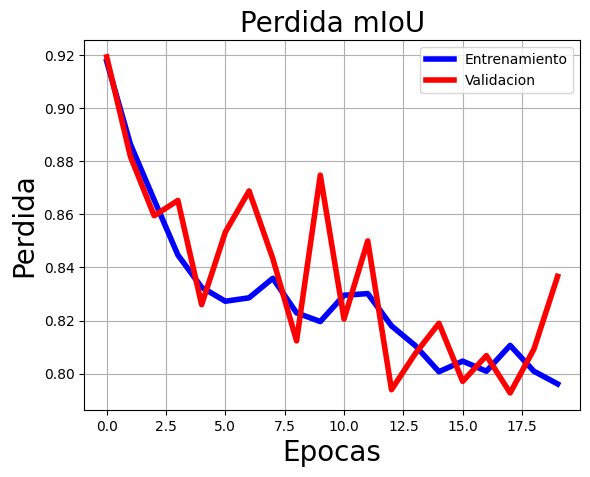

Entrenamiento con configuracion 2: {'step_size': 1, 'gamma': 0.7, 'bilinear': False}
[Epoch 0/20] [Batch 45/46] [Loss: 0.945762 (0.926497)] epoch 0 - loss : 0.92650 - acc : 0.38 - val loss : 0.90871 - val acc : 0.43
[Epoch 1/20] [Batch 45/46] [Loss: 0.813723 (0.889692)] epoch 1 - loss : 0.88969 - acc : 0.45 - val loss : 0.88228 - val acc : 0.52
[Epoch 2/20] [Batch 45/46] [Loss: 0.818244 (0.871234)] epoch 2 - loss : 0.87123 - acc : 0.45 - val loss : 0.86489 - val acc : 0.43
[Epoch 3/20] [Batch 45/46] [Loss: 0.936098 (0.851982)] epoch 3 - loss : 0.85198 - acc : 0.46 - val loss : 0.82316 - val acc : 0.55
[Epoch 4/20] [Batch 45/46] [Loss: 0.910917 (0.842084)] epoch 4 - loss : 0.84208 - acc : 0.48 - val loss : 0.80662 - val acc : 0.53
[Epoch 5/20] [Batch 45/46] [Loss: 0.821624 (0.833501)] epoch 5 - loss : 0.83350 - acc : 0.48 - val loss : 0.82418 - val acc : 0.50
[Epoch 6/20] [Batch 45/46] [Loss: 0.995026 (0.829348)] epoch 6 - loss : 0.82935 - acc : 0.48 - val loss : 0.82186 - val acc : 0.5

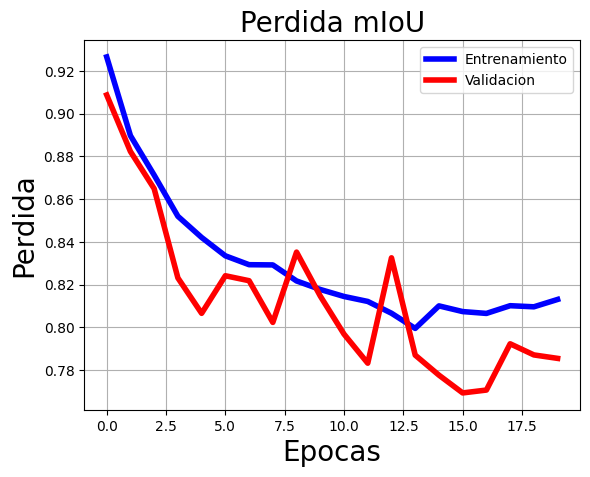

Entrenamiento con configuracion 3: {'step_size': 2, 'gamma': 0.6, 'bilinear': True}
[Epoch 0/20] [Batch 45/46] [Loss: 0.949000 (0.919359)] epoch 0 - loss : 0.91936 - acc : 0.38 - val loss : 0.95638 - val acc : 0.16
[Epoch 1/20] [Batch 45/46] [Loss: 0.857352 (0.870236)] epoch 1 - loss : 0.87024 - acc : 0.45 - val loss : 0.88045 - val acc : 0.40
[Epoch 2/20] [Batch 45/46] [Loss: 0.866512 (0.861132)] epoch 2 - loss : 0.86113 - acc : 0.44 - val loss : 0.87911 - val acc : 0.48
[Epoch 3/20] [Batch 45/46] [Loss: 0.939249 (0.847781)] epoch 3 - loss : 0.84778 - acc : 0.47 - val loss : 0.82394 - val acc : 0.54
[Epoch 4/20] [Batch 45/46] [Loss: 0.969914 (0.837055)] epoch 4 - loss : 0.83706 - acc : 0.49 - val loss : 0.82703 - val acc : 0.54
[Epoch 5/20] [Batch 45/46] [Loss: 0.661780 (0.833303)] epoch 5 - loss : 0.83330 - acc : 0.50 - val loss : 0.83851 - val acc : 0.52
[Epoch 6/20] [Batch 45/46] [Loss: 0.870567 (0.830804)] epoch 6 - loss : 0.83080 - acc : 0.50 - val loss : 0.84943 - val acc : 0.48

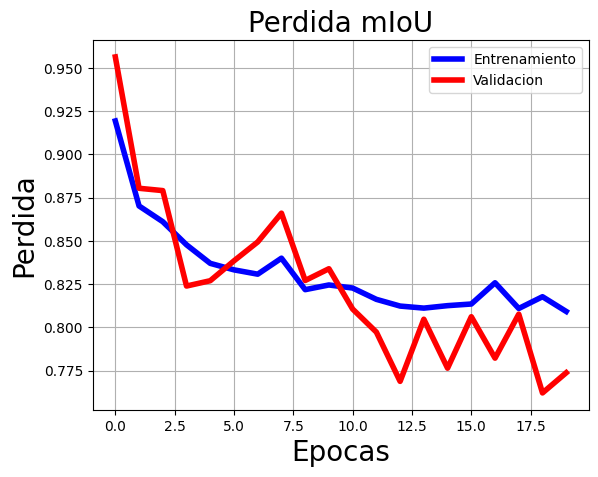

Entrenamiento con configuracion 4: {'step_size': 2, 'gamma': 0.8, 'bilinear': False}
[Epoch 0/20] [Batch 45/46] [Loss: 0.902022 (0.920141)] epoch 0 - loss : 0.92014 - acc : 0.38 - val loss : 0.93603 - val acc : 0.25
[Epoch 1/20] [Batch 45/46] [Loss: 0.813344 (0.881486)] epoch 1 - loss : 0.88149 - acc : 0.44 - val loss : 0.90996 - val acc : 0.31
[Epoch 2/20] [Batch 45/46] [Loss: 0.846361 (0.862526)] epoch 2 - loss : 0.86253 - acc : 0.46 - val loss : 0.88879 - val acc : 0.40
[Epoch 3/20] [Batch 45/46] [Loss: 0.924456 (0.852619)] epoch 3 - loss : 0.85262 - acc : 0.48 - val loss : 0.89516 - val acc : 0.39
[Epoch 5/20] [Batch 45/46] [Loss: 0.968053 (0.831998)] epoch 5 - loss : 0.83200 - acc : 0.51 - val loss : 0.82062 - val acc : 0.53
[Epoch 6/20] [Batch 45/46] [Loss: 0.844421 (0.829314)] epoch 6 - loss : 0.82931 - acc : 0.50 - val loss : 0.81802 - val acc : 0.54
[Epoch 7/20] [Batch 45/46] [Loss: 0.924352 (0.834538)] epoch 7 - loss : 0.83454 - acc : 0.49 - val loss : 0.83049 - val acc : 0.5

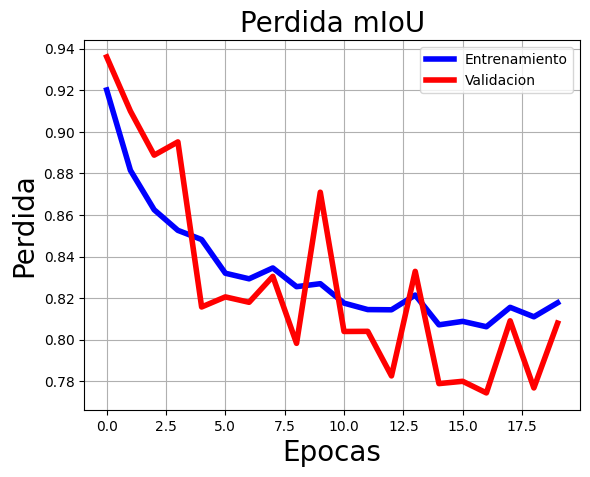

In [ ]:
#-----------------
# Configuraciones para cada entrenamiento
#-----------------
configs = [
    {'step_size': 1, 'gamma': 0.5, 'bilinear': True},
    {'step_size': 1, 'gamma': 0.7, 'bilinear': False},
    {'step_size': 2, 'gamma': 0.6, 'bilinear': True},
    {'step_size': 2, 'gamma': 0.8, 'bilinear': False}
]

#-----------------
# Perdida minima observada
#-----------------
min_loss = torch.tensor(float('inf'))

#-----------------
# Entrenando con cada configuracion
#-----------------
for i, config in enumerate(configs):
    print(f"Entrenamiento con configuracion {i+1}: {config}")

    #-----------------
    # Instanciando el modelo
    #-----------------
    model = UNet(n_channels=3, n_classes=8, bilinear=config['bilinear']).to(device)

    #-----------------
    # Configurando el optimizador
    #-----------------
    optimizer = torch.optim.Adam(model.parameters(), lr=1e-3)

    #-----------------
    # Configurando el scheduler
    #-----------------
    lr_scheduler = torch.optim.lr_scheduler.StepLR(optimizer, step_size=config['step_size'], gamma=config['gamma'])

    #-----------------
    # Carpeta para guardar los modelos
    #-----------------
    save_path=f'./saved_unet_models_config_{i+1}'

    #-----------------
    # Iniciando el entrenamiento
    #-----------------
    plot_losses, min_loss = train_and_evaluate(
        model = model,
        train_dataloader = train_dataloader,
        test_dataloader  = test_dataloader,
        criterion    = criterion,
        optimizer    = optimizer,
        lr_scheduler = lr_scheduler,
        device       = device,
        n_epochs     = 20,
        save_path    = save_path
    )

    #-----------------
    # Graficando las perdidas vs las epocas
    #-----------------
    plot_losses = np.array(plot_losses)
    plt.plot(plot_losses[:,0], plot_losses[:,1], color='b', linewidth=4)
    plt.plot(plot_losses[:,0], plot_losses[:,2], color='r', linewidth=4)
    plt.title('Perdida mIoU', fontsize=20)
    plt.xlabel('Epocas',fontsize=20)
    plt.ylabel('Perdida',fontsize=20)
    plt.grid()
    plt.legend(['Entrenamiento', 'Validacion'])
    plt.show()

Se observa que las pérdidas durante el entrenamiento y la validación disminuyen a medida que avanzan las épocas, lo cual indica que el modelo está aprendiendo.

Sin embargo, durante la validación se observan ciertas fluctuaciones. Esto podría indicar que el modelo se ajusta bien al conjunto de entrenamiento, pero no de manera consistente en el conjunto de validación, manifestando así un sobreajuste que puede ser mejorado aumentando el número de épocas o de imágenes de entrenamiento.

Los experimentos muestran también que los mejores resultados se obtuvieron con la configuración 3: `{'step_size': 2, 'gamma': 0.6, 'bilinear': True}`. Esto puede deberse debido a que:

- con `step_size = 2`, la tasa de aprendizaje se reduce cada dos épocas, lo que permite al modelo hacer ajustes más finos después de un par de épocas, mejorando la convergencia.

- con `gamma = 0.6` se obtiene una reducción gradual de la tasa de aprendizaje que ayuda a evitar caer en mínimos locales prematuramente, permitiendo un ajuste más cuidadoso.

- con `Bilinear=True`, el upsampling bilineal es más suave y puede mejorar la calidad de la segmentación al evitar artefactos, lo que es crucial para una tarea como la segmentación semántica.

## **8.1 Pruebas con U-Net**

Después del entrenamiento se llevan a cabo algunas pruebas:

- Se carga del mejor modelo con los pesos guardados en la mejor época.

- El modelo se instancia en modo de evaluación (model.eval()), desactivando el dropout y la normalización por lotes, si están presentes.

- Finalmente se itera sobre los lotes de datos de prueba.

Para cada imagen en el lote, el modelo realiza la predicción de la máscara.

Despues, se muestran la imagen original (izquierda), la máscara de verdad (ground truth, centro), y la máscara predicha (derecha) con el fin de comparar visualmente las predicciones del modelo con las máscaras reales, facilitando la evaluación cualitativa del rendimiento del modelo.

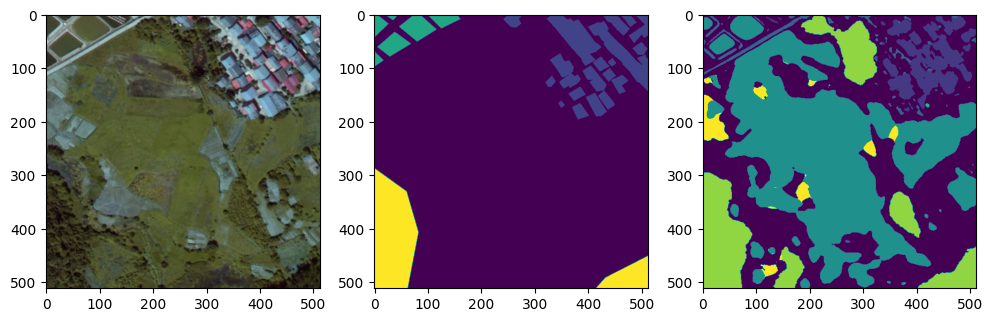

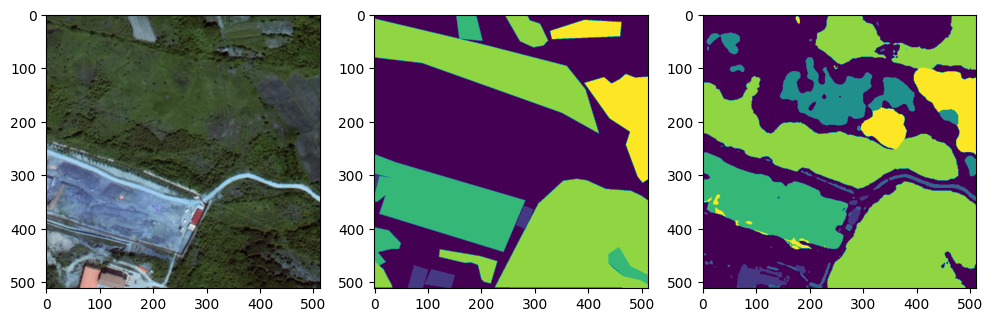

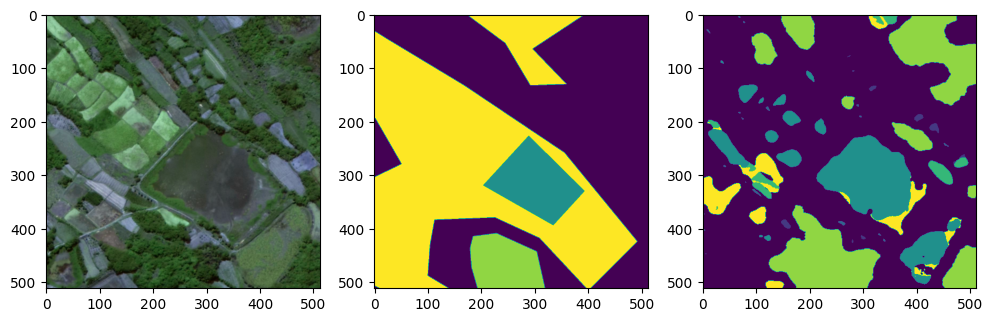

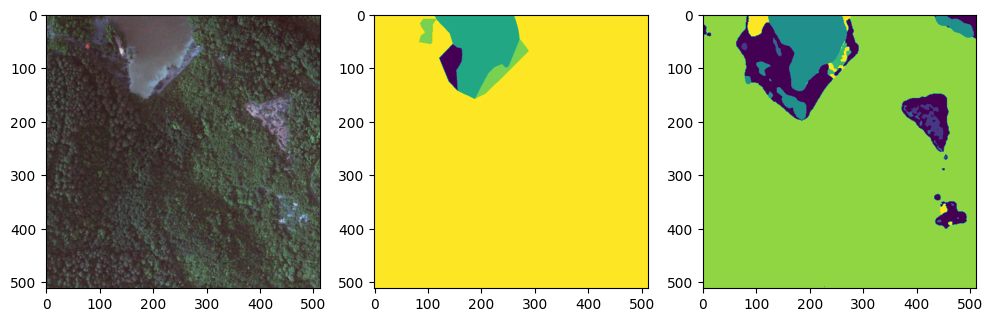

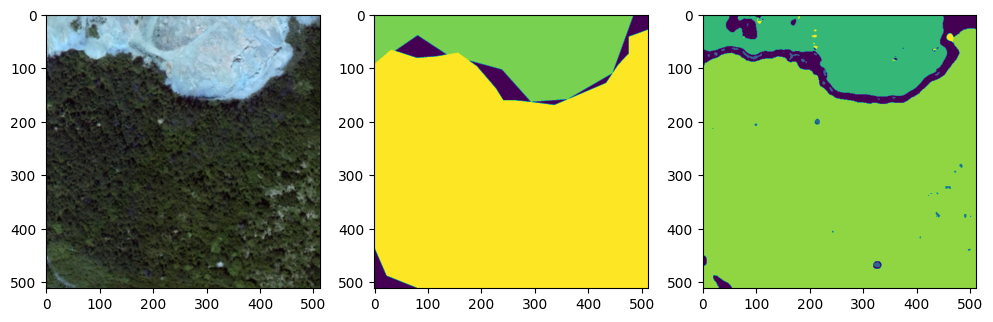

...

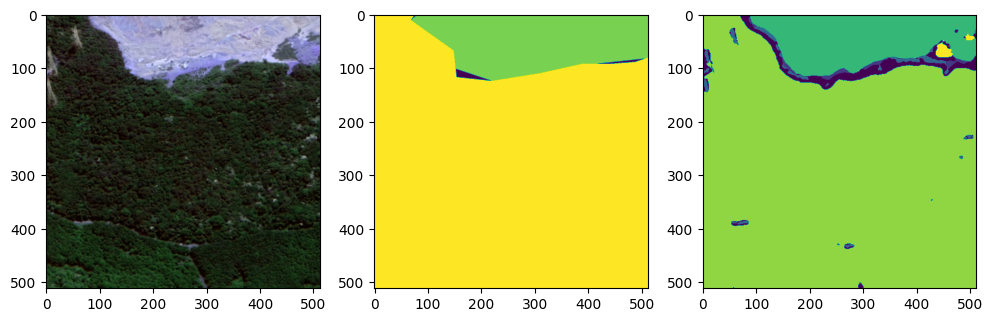

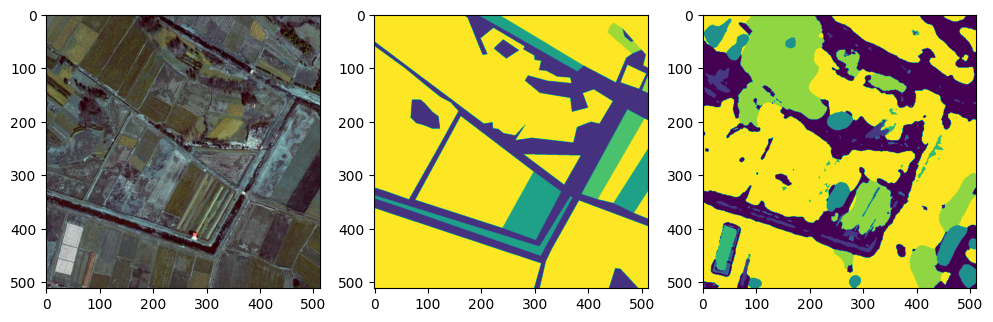

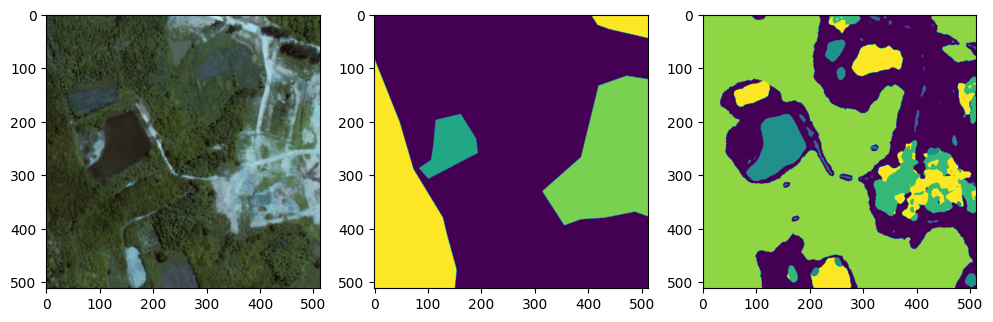

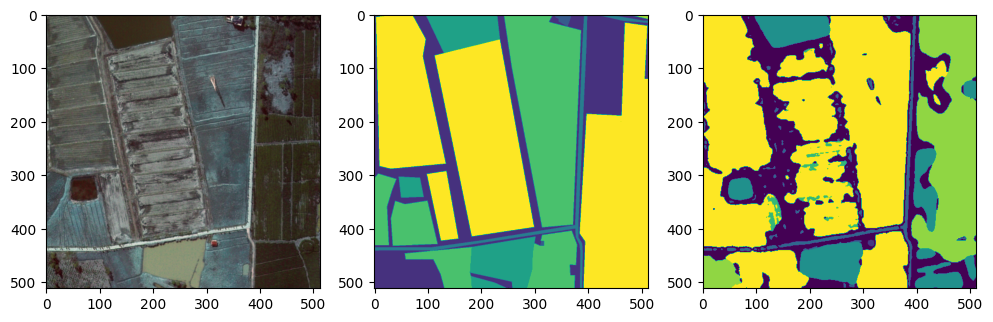

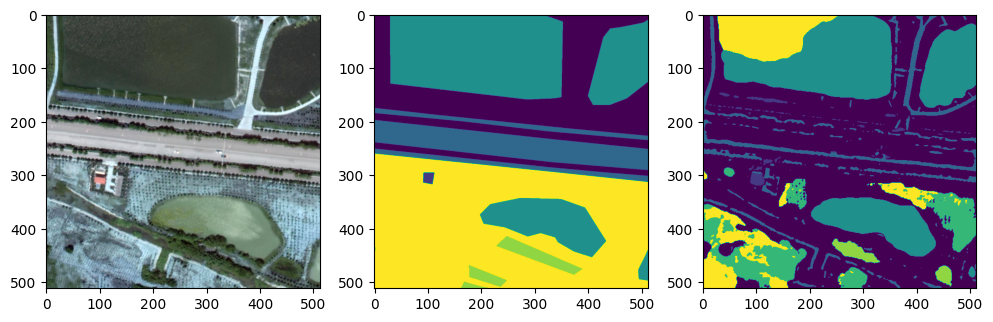

In [ ]:
model = UNet(n_channels=3, n_classes=8, bilinear=True).to(device)

model.load_state_dict(torch.load('./saved_unet_models_config_3/model_epoch_18_0.76217.pt'))

model.eval()

for batch_i, (x, y) in enumerate(test_dataloader):
    for j in range(len(x)):
        result = model(x.to(device)[j:j+1])
        mask = torch.argmax(result, axis=1).cpu().detach().numpy()[0]
        im = np.moveaxis(x.to(device)[j].cpu().detach().numpy(), 0, -1).copy()*255
        im = im.astype(int)
        gt_mask = y[j]

        plt.figure(figsize=(12,12))

        plt.subplot(1,3,1)
        im = np.moveaxis(x.to(device)[j].cpu().detach().numpy(), 0, -1).copy()*255
        im = im.astype(int)
        plt.imshow(im)

        plt.subplot(1,3,2)
        plt.imshow(gt_mask)

        plt.subplot(1,3,3)
        plt.imshow(mask)
        plt.show()

Las imágenes anteriores indican que aunque el modelo logró aprender a detectar ciertas regiones como campos de cultivo y cuerpos de agua, aún muestra confusión a la hora de reconocer caminos, zonas verdes extensas y edificios, los cuales poseen trazos y detalles más finos y geométricos.

Esta confusión es causada principalmente por el tamaño reducido del dataset.

## **9. Entrenamiento con SegNet**

Como en el caso anterior, se definen 4 configuraciones pero esta vez cambiando `step_size` y `gamma`. En cada caso:

- se instancia el modelo con 8 clases de salida.

- se configura el scheduler de la tasa de aprendizaje con el método `StepLR` que reduce la tasa de aprendizaje en un factor de 0.5 cada vez que se alcanza un número específico de pasos (step_size). Esta variable toma el valor 1 en las configuraciones 1 y 2, y 2 en las configuraciones 3 y 4.

- el parámetro `gamma` también cambia en cada configuración para observar su efecto en el entrenamiento.

La variable `min_loss` se usa para almacenar la pérdida mínima observada durante el entrenamiento.

Se utiliza también el optimizador Adam con una tasa de aprendizaje inicial de 1e-3.

Entrenamiento con configuracion 1: {'step_size': 1, 'gamma': 0.5}
[Epoch 0/20] [Batch 45/46] [Loss: 0.911349 (0.930864)] epoch 0 - loss : 0.93086 - acc : 0.36 - val loss : 0.93517 - val acc : 0.34
[Epoch 1/20] [Batch 45/46] [Loss: 0.893284 (0.915738)] epoch 1 - loss : 0.91574 - acc : 0.42 - val loss : 0.90055 - val acc : 0.45
[Epoch 2/20] [Batch 45/46] [Loss: 0.882545 (0.895891)] epoch 2 - loss : 0.89589 - acc : 0.43 - val loss : 0.89491 - val acc : 0.45
[Epoch 3/20] [Batch 45/46] [Loss: 0.830710 (0.891702)] epoch 3 - loss : 0.89170 - acc : 0.42 - val loss : 0.89607 - val acc : 0.40
[Epoch 4/20] [Batch 45/46] [Loss: 0.823039 (0.891479)] epoch 4 - loss : 0.89148 - acc : 0.43 - val loss : 0.89030 - val acc : 0.45
[Epoch 5/20] [Batch 45/46] [Loss: 0.956892 (0.891830)] epoch 5 - loss : 0.89183 - acc : 0.42 - val loss : 0.88383 - val acc : 0.47
[Epoch 6/20] [Batch 45/46] [Loss: 0.916857 (0.883751)] epoch 6 - loss : 0.88375 - acc : 0.43 - val loss : 0.88850 - val acc : 0.50
[Epoch 7/20] [Bat

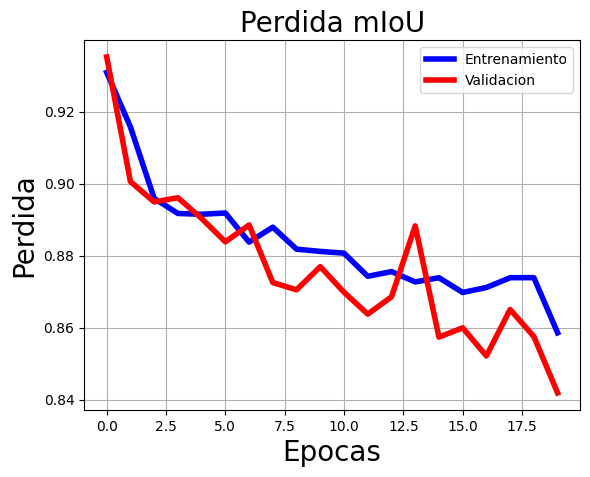

Entrenamiento con configuracion 2: {'step_size': 1, 'gamma': 0.7}
[Epoch 0/20] [Batch 45/46] [Loss: 0.938162 (0.935482)] epoch 0 - loss : 0.93548 - acc : 0.37 - val loss : 0.92272 - val acc : 0.41
[Epoch 1/20] [Batch 45/46] [Loss: 0.875186 (0.919444)] epoch 1 - loss : 0.91944 - acc : 0.37 - val loss : 0.91497 - val acc : 0.41
[Epoch 2/20] [Batch 45/46] [Loss: 0.941463 (0.903793)] epoch 2 - loss : 0.90379 - acc : 0.41 - val loss : 0.91963 - val acc : 0.37
[Epoch 3/20] [Batch 45/46] [Loss: 0.966651 (0.902312)] epoch 3 - loss : 0.90231 - acc : 0.39 - val loss : 0.90702 - val acc : 0.41
[Epoch 4/20] [Batch 45/46] [Loss: 0.970452 (0.893784)] epoch 4 - loss : 0.89378 - acc : 0.42 - val loss : 0.90511 - val acc : 0.41
[Epoch 5/20] [Batch 45/46] [Loss: 0.776284 (0.884194)] epoch 5 - loss : 0.88419 - acc : 0.45 - val loss : 0.89914 - val acc : 0.43
[Epoch 6/20] [Batch 45/46] [Loss: 0.961392 (0.887569)] epoch 6 - loss : 0.88757 - acc : 0.43 - val loss : 0.90113 - val acc : 0.42
[Epoch 7/20] [Bat

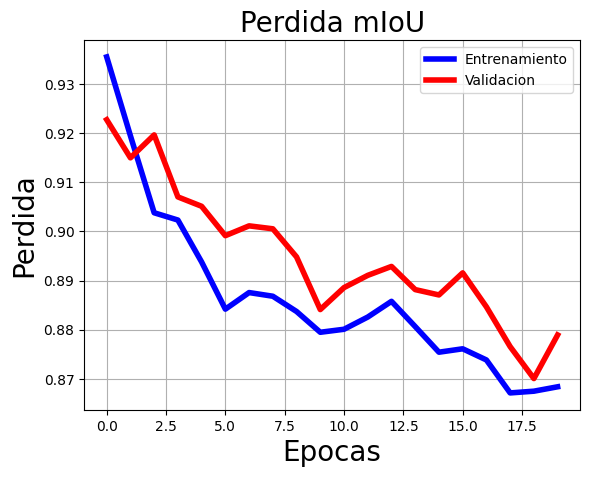

Entrenamiento con configuracion 3: {'step_size': 2, 'gamma': 0.6}
[Epoch 0/20] [Batch 45/46] [Loss: 0.863898 (0.935351)] epoch 0 - loss : 0.93535 - acc : 0.35 - val loss : 0.92450 - val acc : 0.41
[Epoch 1/20] [Batch 45/46] [Loss: 0.928152 (0.920227)] epoch 1 - loss : 0.92023 - acc : 0.39 - val loss : 0.92548 - val acc : 0.40
[Epoch 2/20] [Batch 45/46] [Loss: 0.998781 (0.901670)] epoch 2 - loss : 0.90167 - acc : 0.44 - val loss : 0.91712 - val acc : 0.39
[Epoch 3/20] [Batch 45/46] [Loss: 0.803081 (0.886509)] epoch 3 - loss : 0.88651 - acc : 0.45 - val loss : 0.89311 - val acc : 0.48
[Epoch 4/20] [Batch 45/46] [Loss: 0.960791 (0.879245)] epoch 4 - loss : 0.87924 - acc : 0.46 - val loss : 0.88759 - val acc : 0.48
[Epoch 5/20] [Batch 45/46] [Loss: 0.860202 (0.873940)] epoch 5 - loss : 0.87394 - acc : 0.46 - val loss : 0.87825 - val acc : 0.50
[Epoch 6/20] [Batch 45/46] [Loss: 0.929710 (0.870642)] epoch 6 - loss : 0.87064 - acc : 0.47 - val loss : 0.88361 - val acc : 0.44
[Epoch 7/20] [Bat

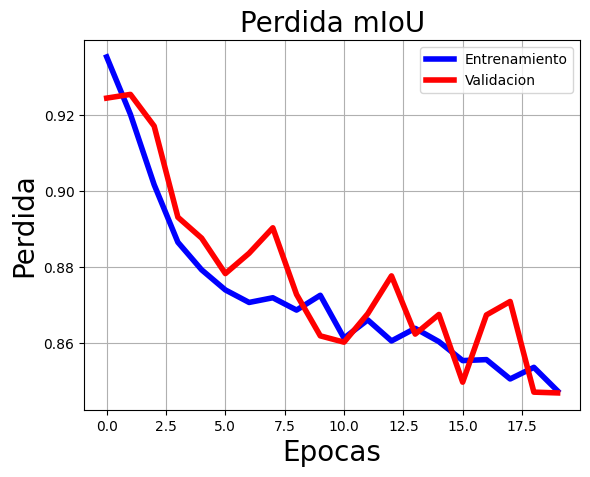

Entrenamiento con configuracion 4: {'step_size': 2, 'gamma': 0.8}
[Epoch 0/20] [Batch 45/46] [Loss: 0.947974 (0.933690)] epoch 0 - loss : 0.93369 - acc : 0.35 - val loss : 0.94478 - val acc : 0.34
[Epoch 1/20] [Batch 45/46] [Loss: 0.948929 (0.903882)] epoch 1 - loss : 0.90388 - acc : 0.44 - val loss : 0.89560 - val acc : 0.46
[Epoch 2/20] [Batch 45/46] [Loss: 0.859439 (0.895609)] epoch 2 - loss : 0.89561 - acc : 0.42 - val loss : 0.88746 - val acc : 0.46
[Epoch 3/20] [Batch 45/46] [Loss: 0.897190 (0.890163)] epoch 3 - loss : 0.89016 - acc : 0.43 - val loss : 0.89648 - val acc : 0.47
[Epoch 4/20] [Batch 45/46] [Loss: 0.864625 (0.882846)] epoch 4 - loss : 0.88285 - acc : 0.43 - val loss : 0.89246 - val acc : 0.47
[Epoch 5/20] [Batch 45/46] [Loss: 0.940693 (0.879510)] epoch 5 - loss : 0.87951 - acc : 0.45 - val loss : 0.89315 - val acc : 0.45
[Epoch 6/20] [Batch 45/46] [Loss: 0.879806 (0.875224)] epoch 6 - loss : 0.87522 - acc : 0.45 - val loss : 0.89972 - val acc : 0.43
[Epoch 7/20] [Bat

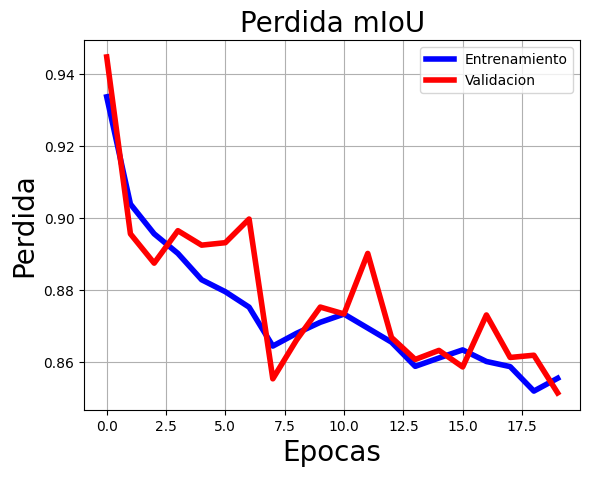

CPU times: user 12min 9s, sys: 2min 15s, total: 14min 24s
Wall time: 2h 1min 15s


In [ ]:
%%time
#-----------------
# Configuraciones para cada entrenamiento
#-----------------
configs = [
    {'step_size': 1, 'gamma': 0.5},
    {'step_size': 1, 'gamma': 0.7},
    {'step_size': 2, 'gamma': 0.6},
    {'step_size': 2, 'gamma': 0.8}
]

#-----------------
# Perdida minima observada
#-----------------
min_loss = torch.tensor(float('inf'))

#-----------------
# Entrenando con cada configuracion
#-----------------
for i, config in enumerate(configs):
    print(f"Entrenamiento con configuracion {i+1}: {config}")

    #-----------------
    # Instanciando el modelo
    #-----------------
    model = SegNet(n_classes=8).to(device)

    #-----------------
    # Configurando el optimizador
    #-----------------
    optimizer = torch.optim.Adam(model.parameters(), lr=1e-3)

    #-----------------
    # Configurando el scheduler
    #-----------------
    lr_scheduler = torch.optim.lr_scheduler.StepLR(optimizer, step_size=config['step_size'], gamma=config['gamma'])

    #-----------------
    # Carpeta para guardar los modelos
    #-----------------
    save_path=f'./saved_segnet_models_config_{i+1}'

    #-----------------
    # Iniciando el entrenamiento
    #-----------------
    plot_losses, min_loss = train_and_evaluate(
        model = model,
        train_dataloader = train_dataloader,
        test_dataloader  = test_dataloader,
        criterion    = criterion,
        optimizer    = optimizer,
        lr_scheduler = lr_scheduler,
        device       = device,
        n_epochs     = 20,
        save_path    = save_path
    )

    #-----------------
    # Graficando las perdidas vs las epocas
    #-----------------
    plot_losses = np.array(plot_losses)
    plt.plot(plot_losses[:,0], plot_losses[:,1], color='b', linewidth=4)
    plt.plot(plot_losses[:,0], plot_losses[:,2], color='r', linewidth=4)
    plt.title('Perdida mIoU', fontsize=20)
    plt.xlabel('Epocas',fontsize=20)
    plt.ylabel('Perdida',fontsize=20)
    plt.grid()
    plt.legend(['Entrenamiento', 'Validacion'])
    plt.show()

Se observa que las pérdidas durante el entrenamiento y la validación disminuyen a medida que avanzan las épocas, lo cual indica que el modelo está aprendiendo.

Sin embargo, durante la validación se observan ciertas fluctuaciones que se hacen menos frecuentes en la ultima configuración con `{'step_size': 2, 'gamma': 0.8}`.

Esto se debe a que con `step_size=2`, la tasa de aprendizaje se reduce cada dos épocas, lo que permite que el modelo aprenda más lentamente y con mayor precisión en las últimas épocas.

Además, el factor de Decaimiento (`gamma=0.8`) reduce la tasa de aprendizaje de manera más gradual en comparación con valores más bajos, lo que permite un ajuste más fino durante las etapas finales del entrenamiento.

## **9.1 Pruebas con SegNet**

Después del entrenamiento se llevan a cabo algunas pruebas:

- Se carga del mejor modelo con los pesos guardados en la mejor época.

- El modelo se instancia en modo de evaluación (model.eval()), desactivando el dropout y la normalización por lotes, si están presentes.

- Finalmente se itera sobre los lotes de datos de prueba.

Para cada imagen en el lote, el modelo realiza la predicción de la máscara.

Despues, se muestran la imagen original, la máscara de verdad (ground truth), y la máscara predicha con el fin de comparar visualmente las predicciones del modelo con las máscaras reales, facilitando la evaluación cualitativa del rendimiento del modelo.

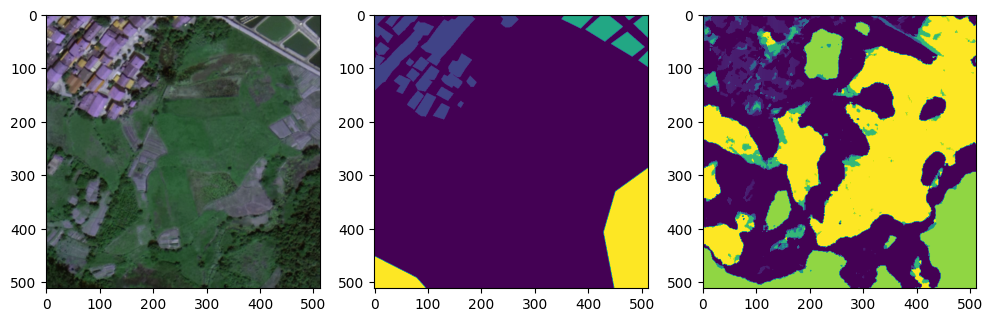

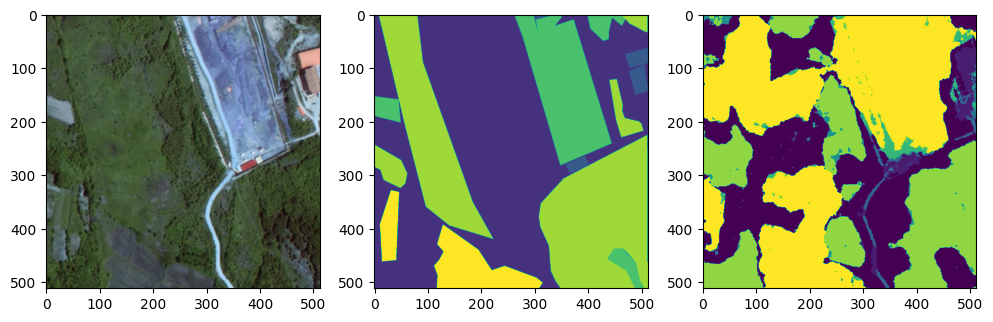

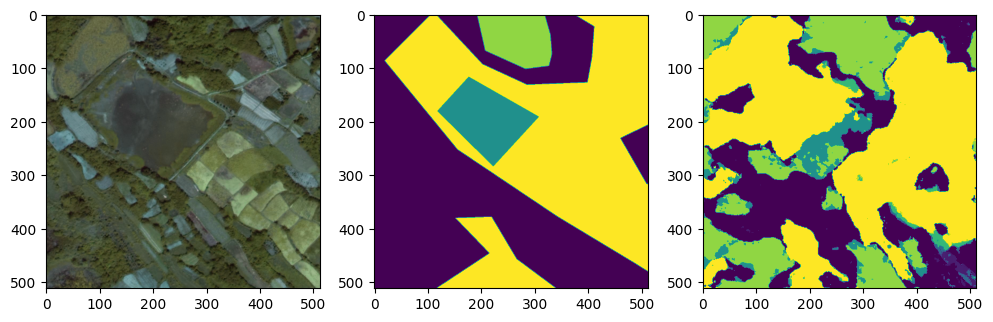

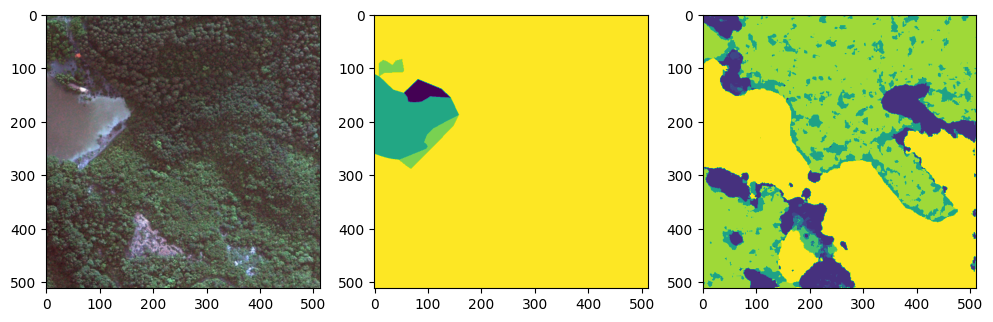

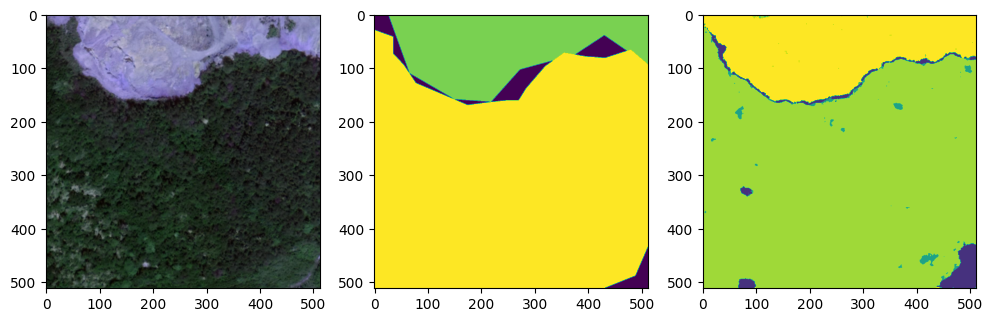

...

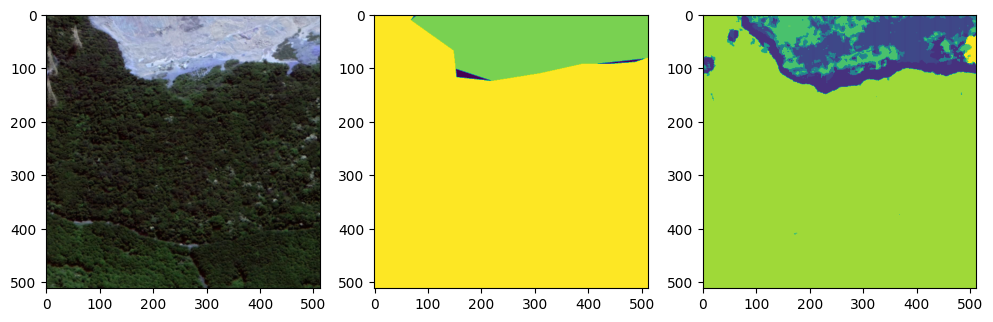

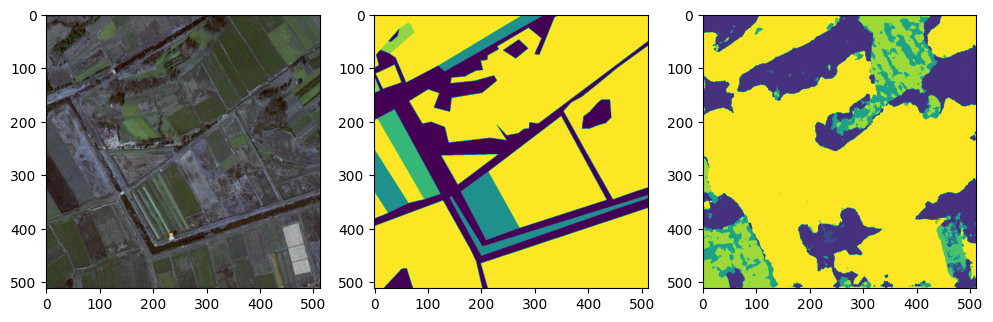

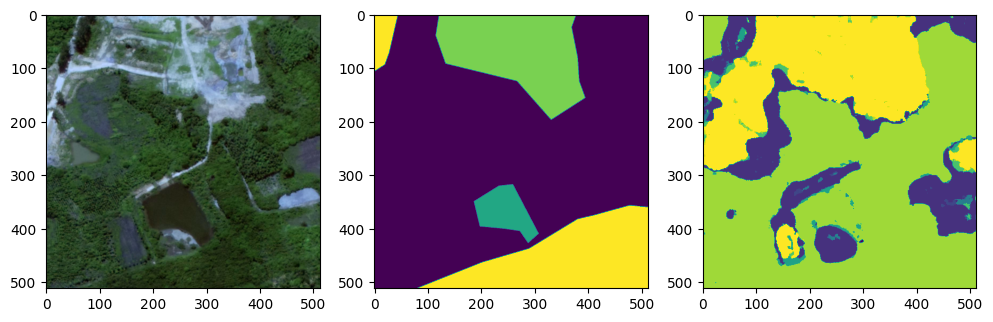

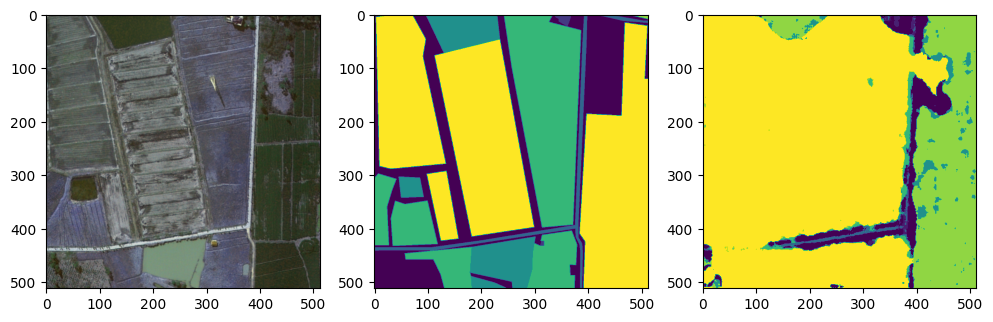

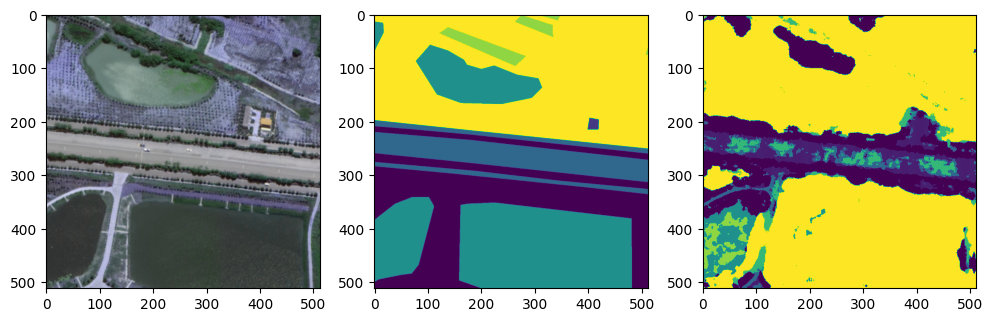

In [ ]:
model.load_state_dict(torch.load('./saved_segnet_models_config_4/model_epoch_19_0.85139.pt'))

model.eval()

for batch_i, (x, y) in enumerate(test_dataloader):
    for j in range(len(x)):
        result = model(x.to(device)[j:j+1])
        mask = torch.argmax(result, axis=1).cpu().detach().numpy()[0]
        im = np.moveaxis(x.to(device)[j].cpu().detach().numpy(), 0, -1).copy()*255
        im = im.astype(int)
        gt_mask = y[j]

        plt.figure(figsize=(12,12))

        plt.subplot(1,3,1)
        im = np.moveaxis(x.to(device)[j].cpu().detach().numpy(), 0, -1).copy()*255
        im = im.astype(int)
        plt.imshow(im)

        plt.subplot(1,3,2)
        plt.imshow(gt_mask)

        plt.subplot(1,3,3)
        plt.imshow(mask)
        plt.show()

De modo semejante al entrenamiento con U-Net, las imágenes muestran que el modelo captura las áreas generales, como los cuerpos de agua y ciertas zonas de vegetación y cultivo, pero presenta mucho ruido y confusión en otras áreas, especialmente donde hay transiciones y detalles más finos.

##**Conclusiones**

A pesar del tamaño reducido del dataset de entrenamiento, los modelos logran aprender ciertas características del dataset, lo que hace que las pérdidas disminuyan con las épocas.

No obstante, la aruitectura U-Net mostró pérdidas menores a las presentadas por la arquitectura SegNet, lo que puede ser una consecuencia del uso del parámetro `Bilinear=True`. Con dicho parámetro se suaviza el upsampling bilineal, mejorando así la calidad de la segmentación.

Los modelos tienen dificultad para distinguir claramente entre algunas clases, lo que resulta en predicciones ruidosas. Esto puede ser mejorado incrementando el número de imágenes en el dataset de entrenamiento, o incluso probando arquitecturas diferentes para mejorar la segmentación, especialmente en las áreas con más detalle que ocupan menos espacio o tienen bordes más complejos.